# Supermarket Customer Analysis

### Objectives:
### Contents:

## 1. Import libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import RobustScaler, StandardScaler
from sklearn.decomposition import FactorAnalysis, PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from yellowbrick.cluster import KElbowVisualizer
from sklearn.metrics import davies_bouldin_score, silhouette_score, calinski_harabasz_score

## 2. Loading data
Import data into df_orig as original dataset. Create copies of it for different data preprocessing steps.

In [2]:
df_orig = pd.read_csv('../data/Supermarket_customers.csv', sep="\t")
df_orig.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


## 3 Descriptive Statistics
Start exploring the dataset.

In [3]:
# Check the shape of the dataset
print(df_orig.shape)

# Check the data types of each column
print(df_orig.dtypes)

(2240, 29)
ID                       int64
Year_Birth               int64
Education               object
Marital_Status          object
Income                 float64
Kidhome                  int64
Teenhome                 int64
Dt_Customer             object
Recency                  int64
MntWines                 int64
MntFruits                int64
MntMeatProducts          int64
MntFishProducts          int64
MntSweetProducts         int64
MntGoldProds             int64
NumDealsPurchases        int64
NumWebPurchases          int64
NumCatalogPurchases      int64
NumStorePurchases        int64
NumWebVisitsMonth        int64
AcceptedCmp3             int64
AcceptedCmp4             int64
AcceptedCmp5             int64
AcceptedCmp1             int64
AcceptedCmp2             int64
Complain                 int64
Z_CostContact            int64
Z_Revenue                int64
Response                 int64
dtype: object


### 3.1 Numeric Features

In [4]:
# Get a summary of the numerical features in the dataset
df_orig.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,...,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,...,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
std,3246.662198,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,...,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,...,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,...,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8427.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,...,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,...,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


### 3.2 Categorical Features

In [5]:
# Get a summary of the categorical features in the dataset
df_orig.describe(include='object')

,Education,Marital_Status,Dt_Customer
count,2240,2240,2240
unique,5,8,663
top,Graduation,Married,31-08-2012
freq,1127,864,12


## 4. Exploratory Data Analysis

- Uncover insights about customer behavior and campaign success.
In the data regarding customers we mainly have two types of features: 
    - Features that describe the demography of customers like: Birth_year, Marital_status, Education, Incom, Kidhome, Teenhome.
    - Features that describe the behaviour of customers like: Amount of products purchased, place of purchase, dealing with campaings, complaining...

### 4.1 Demographic Features

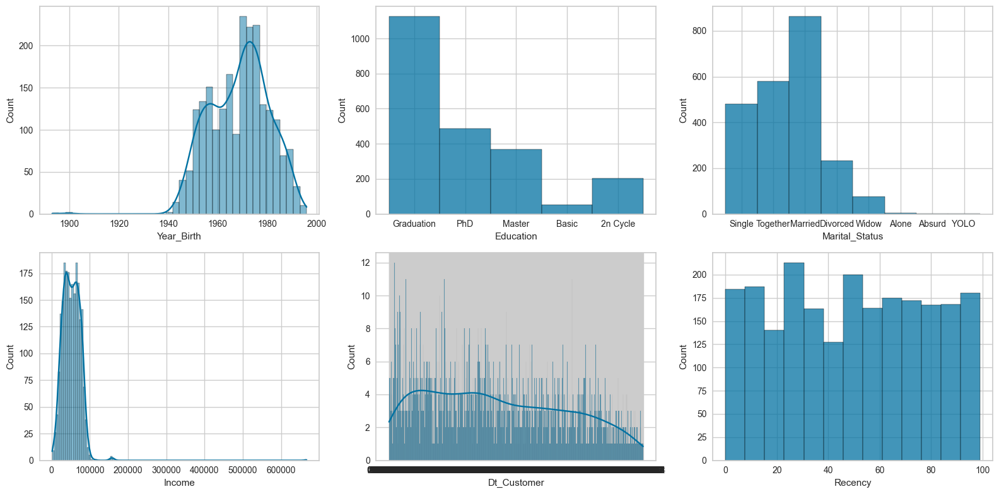

In [8]:
fig, axes = plt.subplots(2,3, figsize=(16, 8))

sns.histplot(df_orig['Year_Birth'], kde=True, ax=axes[0, 0])

sns.histplot(df_orig['Education'], ax=axes[0, 1])

sns.histplot(df_orig['Marital_Status'], ax=axes[0, 2])

sns.histplot(df_orig['Income'], kde=True, ax=axes[1, 0])

sns.histplot(df_orig['Dt_Customer'], kde=True, ax=axes[1, 1])

# No. of days since last purchase
sns.histplot(df_orig['Recency'], ax=axes[1, 2])

#sns.histplot(df['total_spending'], ax=axes[2, 1])

# no. of visits to the company's website in the last month
#sns.histplot(df['NumWebVisitsMonth'], ax=axes[2, 2])

plt.tight_layout()
plt.show()

** There exist outliers in Year_Birth and Income columns that need to be addressed. **

Text(0.5, 1.0, 'Number of Kids VS Number of Teens in Customer Household')

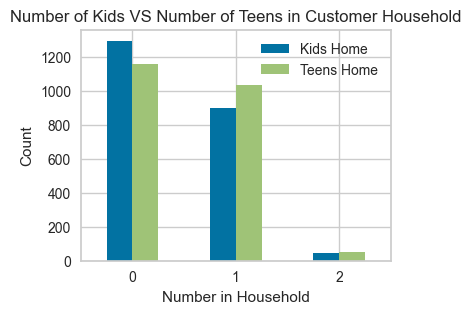

In [9]:
kid = df_orig.Kidhome.value_counts()
teen = df_orig.Teenhome.value_counts()

counts = pd.DataFrame({0:[kid[0], teen[0]], 1:[kid[1], teen[1]] ,2:[kid[2], teen[2]]},
                    index=['Kids Home', 'Teens Home']).T

counts.plot(kind="bar", rot=0, figsize=(4,3));
plt.xlabel("Number in Household")
plt.ylabel("Count")
plt.title("Number of Kids VS Number of Teens in Customer Household")

### 4.2 Features Showing Behaviour

#### Products

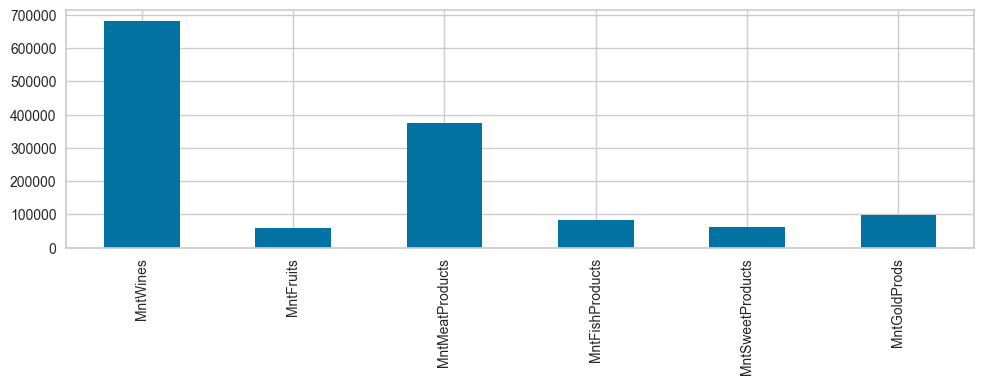

In [ ]:
# Products
df_orig[['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']].sum().plot(kind='bar', figsize=(10, 4))

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

** Spending on Products based on Education level**

Text(0.5, 1.0, 'Average Amount Spent On Products for Each Education Level')

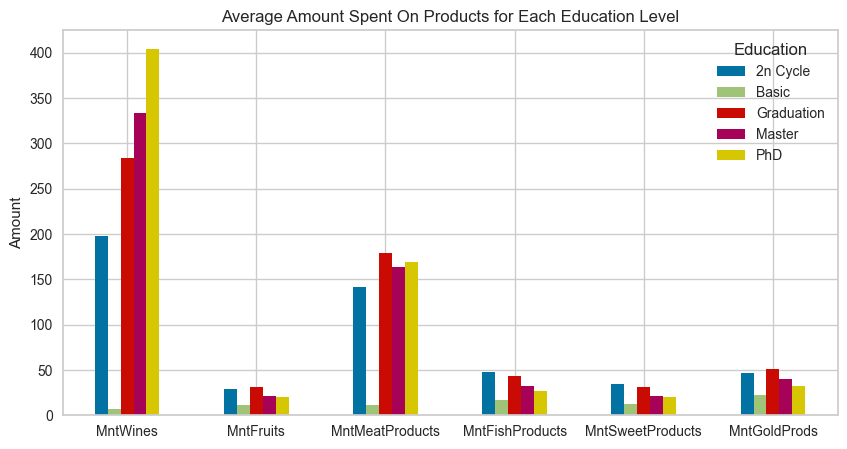

In [11]:
# Spending by Education level
cat = df_orig.groupby('Education')[['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts',
          'MntSweetProducts', 'MntGoldProds']].mean().T

cat.plot(kind='bar', rot=0, figsize=(10,5));
plt.ylabel("Amount")
plt.title("Average Amount Spent On Products for Each Education Level")

Text(0.5, 1.0, 'Ratio of Discounted Purchases to Normal Perchases Per Education Level')

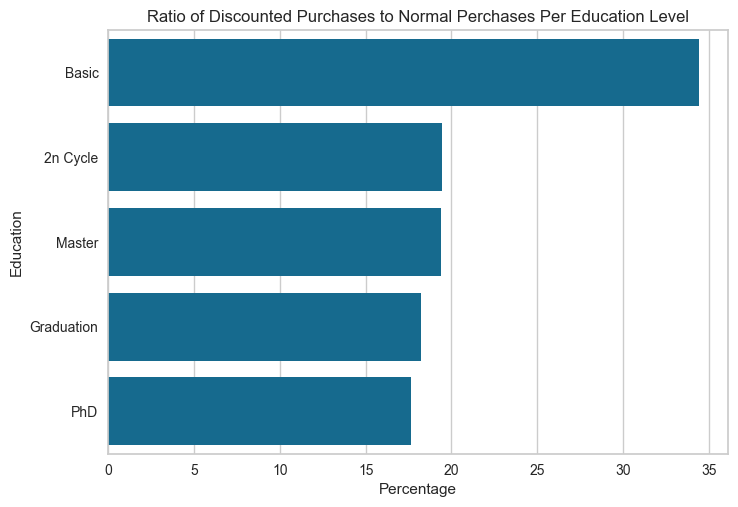

In [12]:
discounted_purchases = df_orig.groupby('Education').NumDealsPurchases.sum()
total_purchases = df_orig.groupby('Education')[['NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases']].sum().sum(axis=1)

percentage = round(discounted_purchases * 100 / total_purchases, 2).sort_values(ascending=False)
sns.barplot(y=percentage.index, x=percentage.values);
plt.xlabel("Percentage")
plt.ylabel("Education")
plt.title("Ratio of Discounted Purchases to Normal Perchases Per Education Level")

#### Acceptance of Campaigns

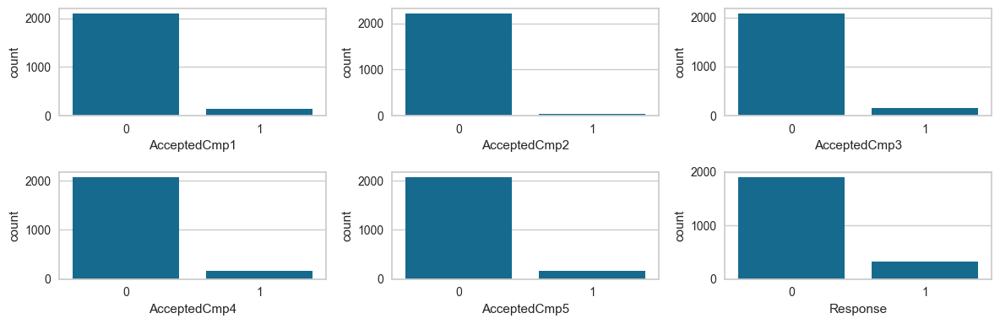

In [13]:
fig, axes = plt.subplots(2, 3, figsize=(12, 4))

sns.countplot(x=df_orig['AcceptedCmp1'], ax=axes[0,0])

sns.countplot(x=df_orig['AcceptedCmp2'], ax=axes[0,1])

sns.countplot(x=df_orig['AcceptedCmp3'], ax=axes[0, 2])

sns.countplot(x=df_orig['AcceptedCmp4'], ax=axes[1,0])

sns.countplot(x=df_orig['AcceptedCmp5'], ax=axes[1,1])

sns.countplot(x=df_orig['Response'], ax=axes[1,2])

plt.tight_layout()
plt.show()

#### Places of Purchase

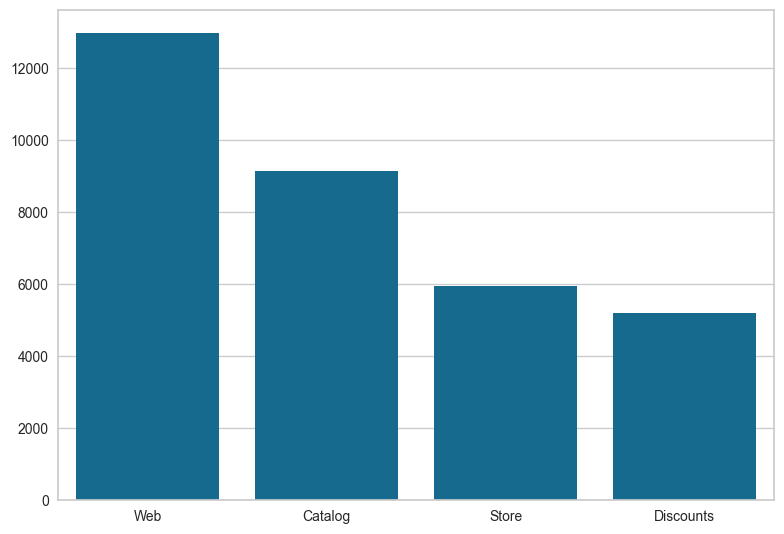

In [14]:
# Looking at the method of buying
buying_method = df_orig[['NumStorePurchases', 'NumWebPurchases', 'NumCatalogPurchases','NumDealsPurchases']].sum()
names = ['Web','Catalog','Store','Discounts']

sns.barplot(y= buying_method.values, x=names)

plt.tight_layout()
plt.show()

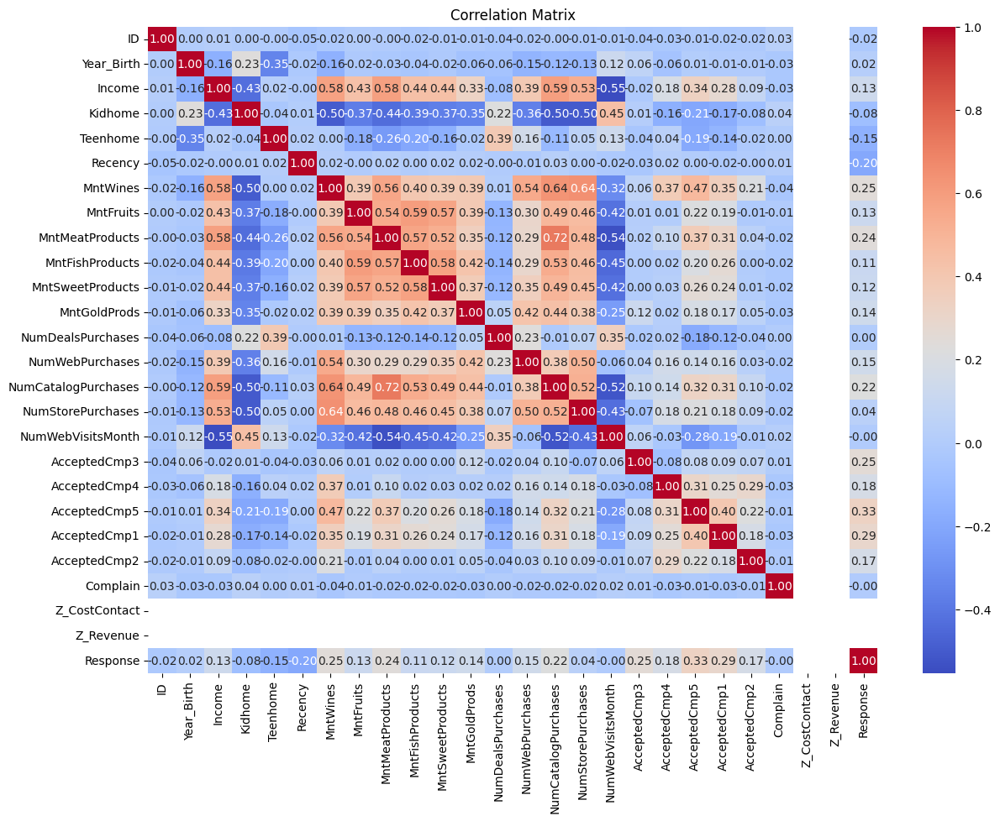

In [16]:
# Example heatmap for correlations of data before categorical encoding
plt.figure(figsize=(14, 10))
sns.heatmap(df_orig.corr(numeric_only=True), annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

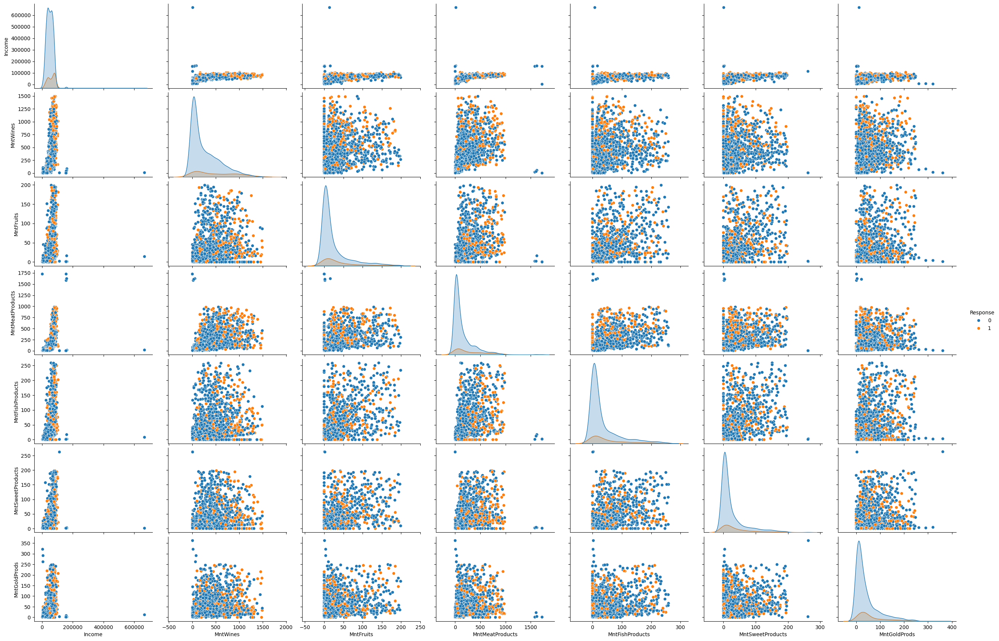

In [17]:
Mnt_features = ['Income', 'MntWines', 'MntFruits','MntMeatProducts', 'MntFishProducts','MntSweetProducts', 'MntGoldProds', 'Response']
sns.pairplot(df_orig[Mnt_features], hue='Response', height=2.5, aspect=1.5, diag_kind='kde')

### 4.2 Identifying Missing Values

In [15]:
# Check for missing values in the 'Income' column
print(df_orig['Income'].isnull().sum())

24


### 4.3 Identifying Outliers

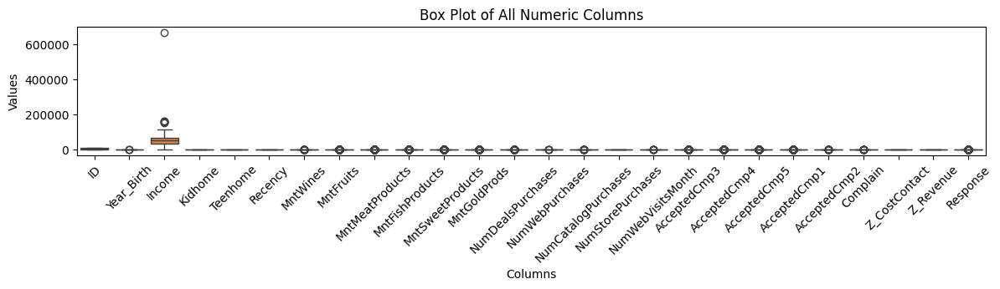

In [19]:
# Set the size of the plot
plt.figure(figsize=(14, 2))

# Create box plots for all numeric columns
sns.boxplot(data=df_orig.select_dtypes(include=[np.number]))

# Add title and labels
plt.title('Box Plot of All Numeric Columns')
plt.xlabel('Columns')
plt.ylabel('Values')

# Show the plot
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.show()

### Insights from Data that need to be addressed:
1. Not needed columns: The columns Z_CostContact and Z_Revenue have single values for all rows and don't add any meaning, so need to be dropped.
2. Missing Values: 24 missing values in Income column.
3. Outliers: There are outliers in Income and Year_Birth columns.
4. Inconsistent types or features: 
    - Dt_customer has date data but has object type.
    - Columns Education and Marital_Status need better organization.

## 5. Data Cleaning

Create a copy of the df_orig into df.

In [4]:
df = df_orig.copy()

# Columns Z_CostContact and Z_Revenue have the same value for all entries and don't add anything to the data.
df.drop(columns=['Z_CostContact','Z_Revenue'], inplace=True, axis=1)

# Setting ID as index
df = df.set_index('ID')

df.shape

(2240, 26)

### 5.1 Handling Missing Values

We have 24 missing values in the Income column. There are many ways to handle it, one is to fill it using the mode of Income with the same Education and Marital_Status columns. We could also add Age later and compare it with the existing results.

In [5]:
# Function to impute missing values in 'Income' with the mode based on 'Education' and 'Marital_Status'
def impute_mode(row):
    if pd.isnull(row['Income']):
        return df[(df['Education'] == row['Education']) & 
                  #(df['Age'] == row['Age']) &
                  (df['Marital_Status'] == row['Marital_Status'])]['Income'].mode()[0]
    else:
        return row['Income']

# Apply the function to fill missing values
df['Income'] = df.apply(impute_mode, axis=1)

### 5.2 Handling Outliers

There is one value in the Income field which is over 6 Million and can be considered an error, so can be removed. There are also very high values over 100K and also very low like over 1K, we keep them as they are since we have a diverse range of education here, from Basic education to PhD, so we keep them as they are.

In [6]:
# Calculate Q1 (25th percentile) and Q3 (75th percentile)
Q1 = df['Income'].quantile(0.25)
Q3 = df['Income'].quantile(0.75)
IQR = Q3 - Q1

# Define bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outlier = 200000

# Remove outliers
#df = df[(df['Income'] >= lower_bound) & (df['Income'] <= upper_bound)]
df = df[(df['Income'] >= lower_bound) & (df['Income'] < outlier)]
df.shape

(2239, 26)

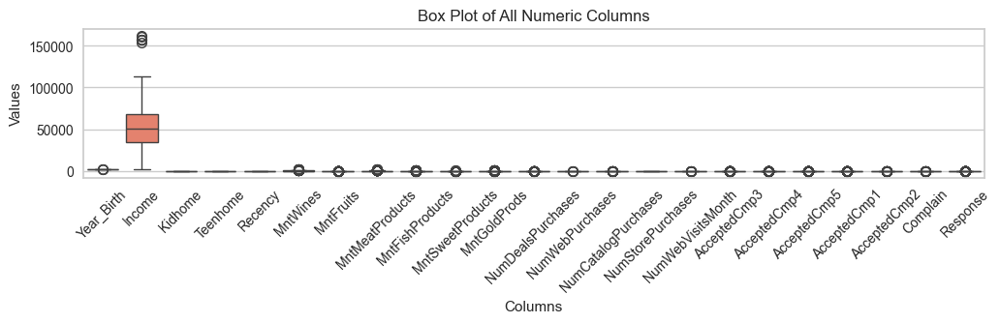

In [7]:
# Set the size of the plot
plt.figure(figsize=(12, 2))

# Create box plots for all numeric columns
sns.boxplot(data=df.select_dtypes(include=[np.number]))

# Add title and labels
plt.title('Box Plot of All Numeric Columns')
plt.xlabel('Columns')
plt.ylabel('Values')

# Show the plot
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.show()

### 3.3 Convert Data Types:

In [8]:
# Change the Year_Birth to age for more simplification
df['Age'] = 2024 - df['Year_Birth']
df.drop(['Year_Birth'], axis=1, inplace=True)

In [9]:
# Convert date strings to datetime
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'], format='mixed').dt.year.astype('int64')

In [10]:
# Handle the inconsistent types
df['Marital_Status'] = df['Marital_Status'].replace({'YOLO':'Single', 'Absurd':'Single', 'Alone':'Single', 'Married':'Together'})
df['Education'] = df['Education'].replace({'2n Cycle':'Master'})

To create a more comprehensible look into data we create a sum value for the columns below.

In [11]:
# total_children
df['total_children'] = df['Kidhome'] + df['Teenhome']

# total_spendings
df["total_spending"] = df["MntWines"]+ df["MntFruits"]+ df["MntMeatProducts"]+ df["MntFishProducts"]+ df["MntSweetProducts"]+ df["MntGoldProds"]

# total_num_of_purchases
df['num_purchase'] = df['NumDealsPurchases'] + df['NumWebPurchases'] + df['NumCatalogPurchases'] + df['NumStorePurchases']

In [12]:
df.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,...,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,total_children,total_spending,num_purchase
ID,,,,,,,,,,,,,,,,,,,,,
5524,Graduation,Single,58138.0,0,0,2012,58,635,88,546,...,0,0,0,0,0,1,67,0,1617,25
2174,Graduation,Single,46344.0,1,1,2014,38,11,1,6,...,0,0,0,0,0,0,70,2,27,6
4141,Graduation,Together,71613.0,0,0,2013,26,426,49,127,...,0,0,0,0,0,0,59,0,776,21
6182,Graduation,Together,26646.0,1,0,2014,26,11,4,20,...,0,0,0,0,0,0,40,1,53,8
5324,PhD,Together,58293.0,1,0,2014,94,173,43,118,...,0,0,0,0,0,0,43,1,422,19


Now create a copy of **df** into **df_encoded** so that we could later use df.

In [13]:
# Create a new copy of dataset that has categorical features encoded
df_encoded = df.copy()

# One-hot encoding
df_encoded = pd.get_dummies(df, columns=['Marital_Status'])

In [14]:
le = LabelEncoder()
df_encoded['Education'] = le.fit_transform(df['Education'])

In [15]:
df_encoded #.drop(columns= ['Kidhome','Teenhome'])

,Education,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,Complain,Response,Age,total_children,total_spending,num_purchase,Marital_Status_Divorced,Marital_Status_Single,Marital_Status_Together,Marital_Status_Widow
ID,,,,,,,,,,,,,,,,,,,,,
5524,1,58138.0,0,0,2012,58,635,88,546,172,...,0,1,67,0,1617,25,False,True,False,False
2174,1,46344.0,1,1,2014,38,11,1,6,2,...,0,0,70,2,27,6,False,True,False,False
4141,1,71613.0,0,0,2013,26,426,49,127,111,...,0,0,59,0,776,21,False,False,True,False
6182,1,26646.0,1,0,2014,26,11,4,20,10,...,0,0,40,1,53,8,False,False,True,False
5324,3,58293.0,1,0,2014,94,173,43,118,46,...,0,0,43,1,422,19,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10870,1,61223.0,0,1,2013,46,709,43,182,42,...,0,0,57,1,1341,18,False,False,True,False
4001,3,64014.0,2,1,2014,56,406,0,30,0,...,0,0,78,3,444,22,False,False,True,False
7270,1,56981.0,0,0,2014,91,908,48,217,32,...,0,0,43,0,1241,19,True,False,False,False


### Correlation between features

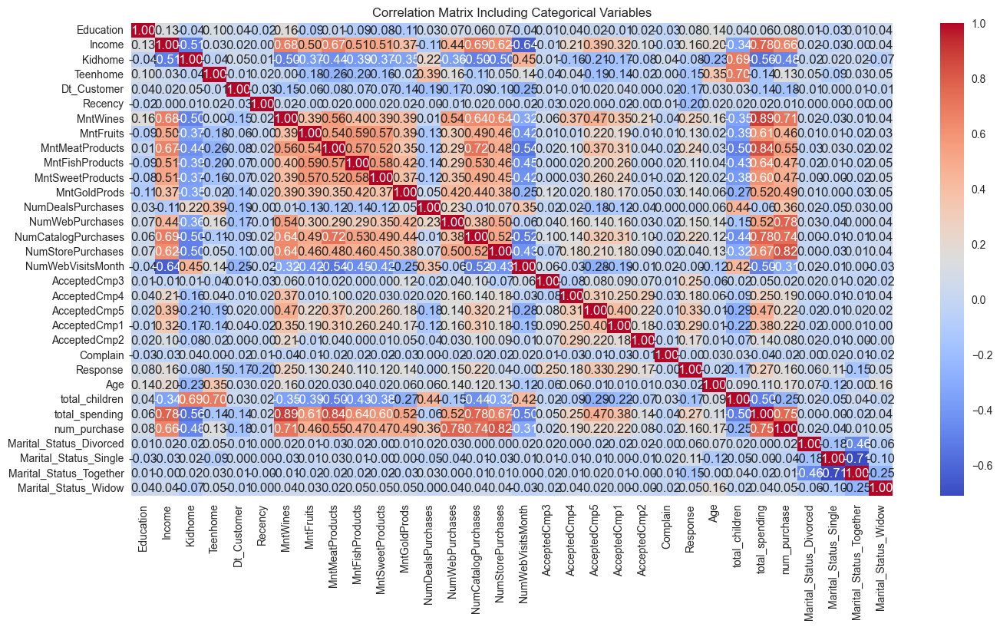

In [16]:
# Heatmap after categorical encoding
plt.figure(figsize=(16, 8))
sns.heatmap(df_encoded.corr(),annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix Including Categorical Variables')
plt.show()

More detailed view of feature correlation with each other in a segmented view.

** Relation of Income with different products distinguished by resoponse **

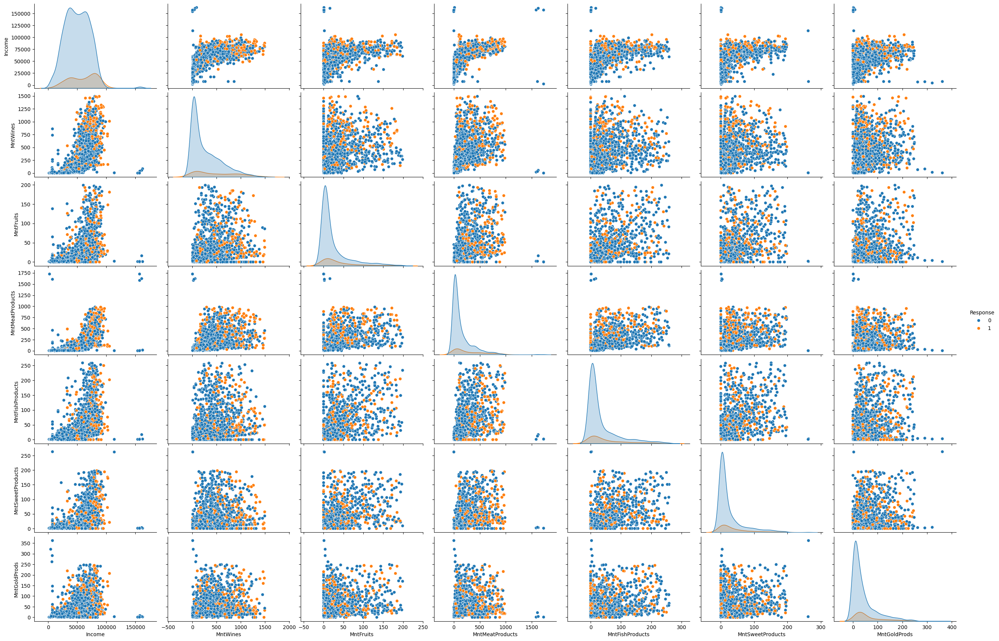

In [60]:
Mnt_features = ['Income', 'MntWines', 'MntFruits','MntMeatProducts', 'MntFishProducts','MntSweetProducts', 'MntGoldProds', 'Response']
sns.pairplot(df[Mnt_features], hue='Response', height=2.5, aspect=1.5, diag_kind='kde')

## 5. Scaling Data
Here we start scaling our data since our data had different values for features. Besides the StandardScaler that is commonly used, we also use RobustScaler because our data has some outliers. We compare the results and then select the one for clustering with better results.

In [17]:
X = df_encoded

In [18]:
# Scale the data with RobustScaler
rb_scaler = RobustScaler()
X_rb_scaled = rb_scaler.fit_transform(X)

In [19]:
# Scale the data with StandardScaler
st_scaler = StandardScaler()
X_st_scaled = st_scaler.fit_transform(X)

## 6. Clustering
Here we use multiple clustering methods to compare the results and findout the best one for this data. Since, many clustering methods need already defined number of clusters, we use the elbow method to findout the number of clusters.

### 6.1 Number of Clusters with Elbow Method

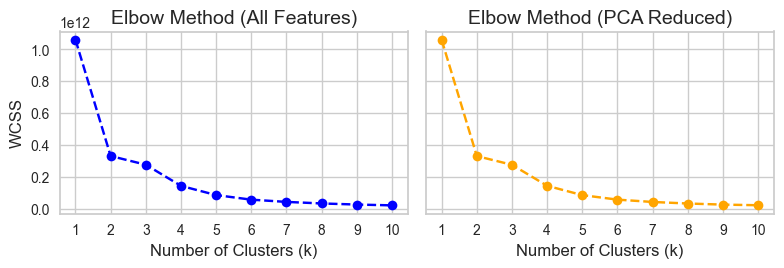

In [20]:
# Using elbow method
wcss = []
for k in range(1, 11):  # Test 1 to 10 clusters
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    kmeans.fit(df_encoded)
    wcss.append(kmeans.inertia_)  # Inertia is the WCSS value

# Apply PCA to reduce dimensions while keeping 95% variance
pca = PCA(n_components=0.95)  # Retain 95% of variance
data_pca = pca.fit_transform(df_encoded)

# Run k-Means on reduced data
wcss_pca = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    kmeans.fit(data_pca)
    wcss_pca.append(kmeans.inertia_)

# Create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(8, 3), sharey=True)

# Subplot 1: WCSS for all features
axes[0].plot(range(1, 11), wcss, marker='o', linestyle='--', color='blue')
axes[0].set_title('Elbow Method (All Features)', fontsize=14)
axes[0].set_xlabel('Number of Clusters (k)', fontsize=12)
axes[0].set_ylabel('WCSS', fontsize=12)
axes[0].set_xticks(range(1, 11))
axes[0].grid(True)

# Subplot 2: WCSS for PCA-reduced data
axes[1].plot(range(1, 11), wcss_pca, marker='o', linestyle='--', color='orange')
axes[1].set_title('Elbow Method (PCA Reduced)', fontsize=14)
axes[1].set_xlabel('Number of Clusters (k)', fontsize=12)
axes[1].set_xticks(range(1, 11))
axes[1].grid(True)

# Adjust layout for better spacing
plt.tight_layout()

# Show the plots
plt.show()

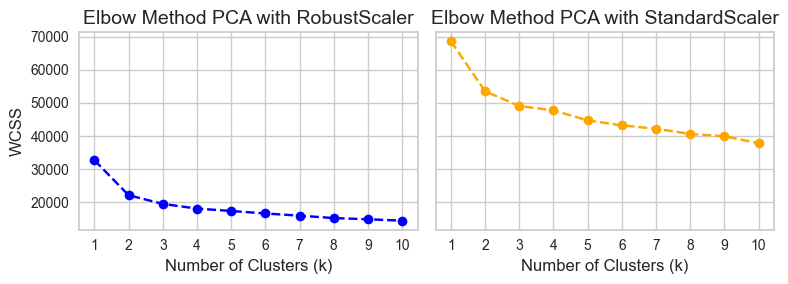

In [22]:
# Apply PCA to reduce dimensions while keeping 95% variance
pca = PCA(n_components=0.95)  # Retain 95% of variance
data_pca_rb = pca.fit_transform(X_rb_scaled)

# Run k-Means on reduced data
wcss_pca_rb = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    kmeans.fit(data_pca_rb)
    wcss_pca_rb.append(kmeans.inertia_)


# Apply PCA to reduce dimensions while keeping 95% variance
pca = PCA(n_components=0.95)  # Retain 95% of variance
data_pca_st = pca.fit_transform(X_st_scaled)

# Run k-Means on reduced data
wcss_pca_st = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    kmeans.fit(data_pca_st)
    wcss_pca_st.append(kmeans.inertia_)

# Create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(8, 3), sharey=True)

# Subplot 1: WCSS for all features
axes[0].plot(range(1, 11), wcss_pca_rb, marker='o', linestyle='--', color='blue')
axes[0].set_title('Elbow Method PCA with RobustScaler', fontsize=14)
axes[0].set_xlabel('Number of Clusters (k)', fontsize=12)
axes[0].set_ylabel('WCSS', fontsize=12)
axes[0].set_xticks(range(1, 11))
axes[0].grid(True)

# Subplot 2: WCSS for PCA-reduced data
axes[1].plot(range(1, 11), wcss_pca_st, marker='o', linestyle='--', color='orange')
axes[1].set_title('Elbow Method PCA with StandardScaler', fontsize=14)
axes[1].set_xlabel('Number of Clusters (k)', fontsize=12)
axes[1].set_xticks(range(1, 11))
axes[1].grid(True)

# Adjust layout for better spacing
plt.tight_layout()

# Show the plots
plt.show()

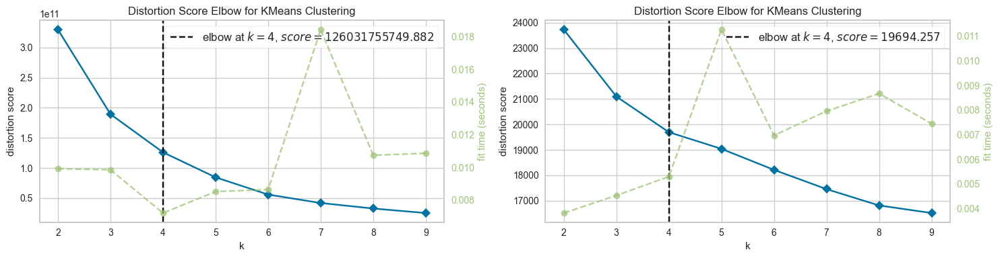

In [26]:
fig, axes = plt.subplots(1, 2, figsize=(15, 4))  # 1 row, 2 columns

# Elbow visualizer for the first dataset
ax1 = axes[0]
model1 = KMeans()
visualizer1 = KElbowVisualizer(model1, k=(2, 10), ax=ax1)
visualizer1.fit(df_encoded)
visualizer1.finalize()  # Finalize ensures the plot works within a subplot

# Elbow visualizer for the second dataset
ax2 = axes[1]
model2 = KMeans()
visualizer2 = KElbowVisualizer(model2, k=(2, 10), ax=ax2)
visualizer2.fit(X_rb_scaled)
visualizer2.finalize()  # Finalize ensures the plot works within a subplot

# Adjust layout and show the plots
plt.tight_layout()
plt.show()

/Users/mariam/Documents/Projects for Github/Customer Personality Analysis/.venv/lib/python3.11/site-packages/yellowbrick/utils/kneed.py:156: YellowbrickWarning: No 'knee' or 'elbow point' detected This could be due to bad clustering, no actual clusters being formed etc.
  warnings.warn(warning_message, YellowbrickWarning)
/Users/mariam/Documents/Projects for Github/Customer Personality Analysis/.venv/lib/python3.11/site-packages/yellowbrick/cluster/elbow.py:374: YellowbrickWarning: No 'knee' or 'elbow' point detected, pass `locate_elbow=False` to remove the warning
  warnings.warn(warning_message, YellowbrickWarning)


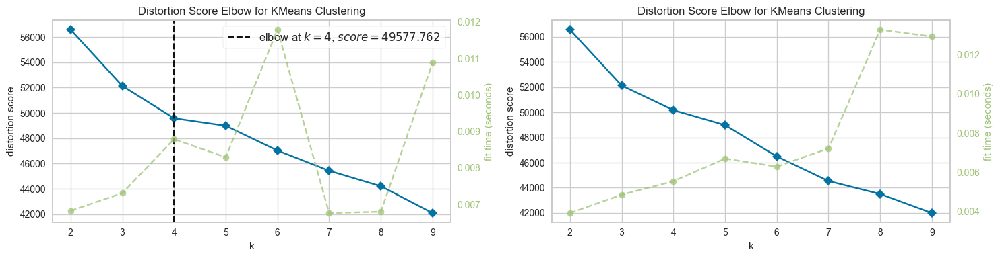

In [25]:
fig, axes = plt.subplots(1, 2, figsize=(15, 4))  # 1 row, 2 columns

# Elbow visualizer for the first dataset
ax1 = axes[0]
model1 = KMeans()
visualizer1 = KElbowVisualizer(model1, k=(2, 10), ax=ax1)
visualizer1.fit(X_st_scaled)
visualizer1.finalize()  # Finalize ensures the plot works within a subplot

# Elbow visualizer for the second dataset
ax2 = axes[1]
model2 = KMeans()
visualizer2 = KElbowVisualizer(model2, k=(2, 10), ax=ax2)
visualizer2.fit(X_st_scaled)
visualizer2.finalize()  # Finalize ensures the plot works within a subplot

# Adjust layout and show the plots
plt.tight_layout()
plt.show()

According to the elbow method the cluster size is 4.

### 6.2 Heirarchical/ Agglomerative Clustering

In [27]:
n_clusters = 4 

# Creating clusters from data without scaling to see the difference with scaled ones
agglomerative = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
labels = agglomerative.fit_predict(df_encoded)

# Data scaled with RobustScaler
agglomerative_rb = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
labels_rb = agglomerative.fit_predict(X_rb_scaled)

# Data scaled with StandardScaler
agglomerative_st = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
labels_st = agglomerative.fit_predict(X_st_scaled)

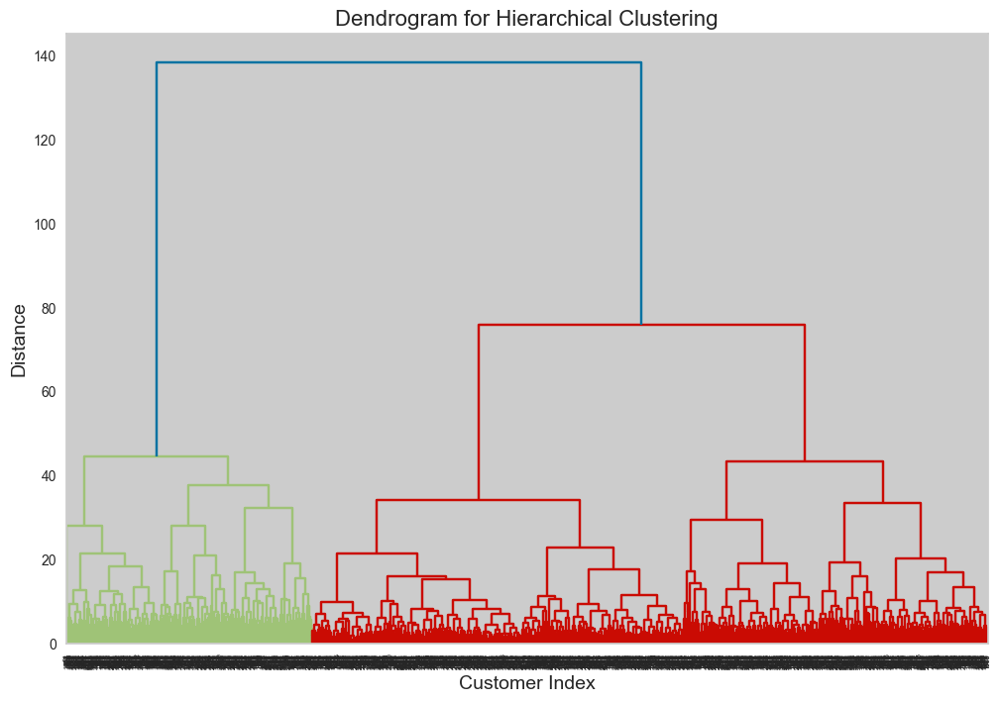

In [26]:
from scipy.cluster.hierarchy import dendrogram, linkage

# Compute linkage matrix
linkage_matrix = linkage(X_rb_scaled, method='ward')

# Plot the dendrogram
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 8))
dendrogram(linkage_matrix)
plt.title("Dendrogram for Hierarchical Clustering", fontsize=16)
plt.xlabel("Customer Index", fontsize=14)
plt.ylabel("Distance", fontsize=14)
plt.show()

### 6.3 DBSCAN Clustering

In [ ]:
# DBSCAN Clustering
dbscan = DBSCAN(eps=0.7, min_samples=5).fit(df_encoded)
cluster_dbscan = dbscan.labels_
#dbscan = DBSCAN(eps=0.5, min_samples=5)
#clusters = dbscan.fit_predict(X_rb_scaled)

# Add cluster labels to your original dataframe
#df_encoded['Cluster_dbscan'] = cluster_dbscan

# Count the number of points in each cluster
#cluster_counts = df_encoded['Cluster_dbscan'].value_counts().sort_index()

# RobustScaler
dbscan_rb = DBSCAN(eps=0.7, min_samples=5).fit(X_rb_scaled)
cluster_dbscan_rb = dbscan_rb.labels_
#df_encoded['Cluster_dbscan_rb'] = cluster_dbscan_rb


#StandardScaler
dbscan_st = DBSCAN(eps=0.7, min_samples=5).fit(X_rb_scaled)
cluster_dbscan_st = dbscan_st.labels_
#df_encoded['Cluster_dbscan_st'] = cluster_dbscan_st



### 6.4 K-Means Clustering

In [29]:
clusterNum = 4

# Data without Scaling
k_means = KMeans(init = "k-means++", n_clusters = clusterNum, n_init = 12)
k_means.fit(df_encoded)
labels_kmeans = k_means.labels_
#df_encoded["Clus_km"] = labels_kmeans
#km_mean = df_encoded.groupby('Clus_km').mean()

# Standard Scaler
k_means_st = KMeans(init = "k-means++", n_clusters = clusterNum, n_init = 12)
k_means_st.fit(X_st_scaled)
labels_kmeans_st = k_means_st.labels_
#df_encoded["Clus_km_st"] = labels_kmeans_st
#st_X_mean = df_encoded.groupby('Clus_km_st').mean()

# Robust Scaler
k_means_rb = KMeans(init = "k-means++", n_clusters = clusterNum, n_init = 12)
k_means_rb.fit(X_rb_scaled)
labels_kmeans_rb = k_means_rb.labels_
#df_encoded["Clus_km_rb"] = labels_kmeans_rb
#rb_X_mean = df_encoded.groupby('Clus_km_rb').mean()



## 7. Visualizing Clusters

Here we visualize the data to be able to see the clusters later on. We first try 2D visualizations and then 3D. We need dimensionality reduction for representing data in 2 or 3 dimensions using the already existing methods like PCA and t-SNE and compare their results.

### 2D Clusters

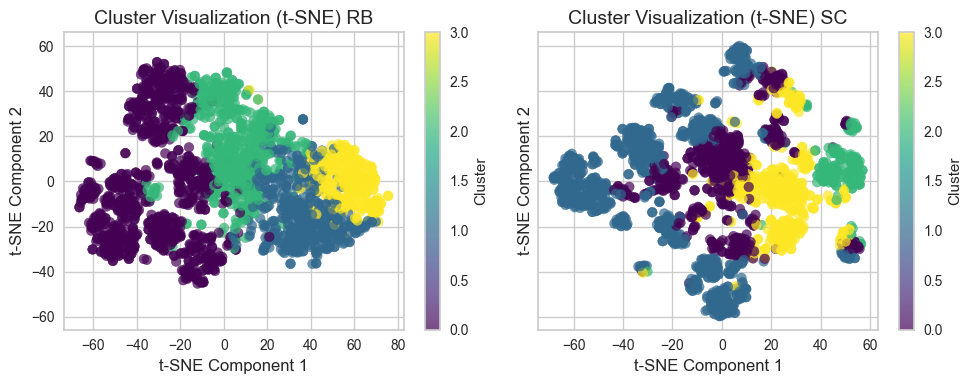

In [31]:
# t-SNE Visualization
tsne_rb = TSNE(n_components=2, random_state=42).fit_transform(X_rb_scaled)  # Reduce to 2D using t-SNE
tsne_df_rb = pd.DataFrame(tsne_rb, columns=['T1', 'T2'])
tsne_df_rb['Cluster'] = k_means_rb.labels_

# t-SNE Visualization
tsne_st = TSNE(n_components=2, random_state=42).fit_transform(X_st_scaled)  # Reduce to 2D using t-SNE
tsne_df_st = pd.DataFrame(tsne_st, columns=['T1', 'T2'])
tsne_df_st['Cluster'] = k_means_st.labels_

# Create Subplots
fig, axes = plt.subplots(1, 2, figsize=(10, 4), sharey=True)

# t-SNE Plot
scatter1 = axes[0].scatter(tsne_df_rb['T1'], tsne_df_rb['T2'], c=tsne_df_rb['Cluster'], cmap='viridis', alpha=0.7)
axes[0].set_title('Cluster Visualization (t-SNE) RB', fontsize=14)
axes[0].set_xlabel('t-SNE Component 1', fontsize=12)
axes[0].set_ylabel('t-SNE Component 2', fontsize=12)
axes[0].grid(True)
cbar2 = fig.colorbar(scatter1, ax=axes[0], label='Cluster')

# t-SNE Plot
scatter2 = axes[1].scatter(tsne_df_st['T1'], tsne_df_st['T2'], c=tsne_df_st['Cluster'], cmap='viridis', alpha=0.7)
axes[1].set_title('Cluster Visualization (t-SNE) SC', fontsize=14)
axes[1].set_xlabel('t-SNE Component 1', fontsize=12)
axes[1].set_ylabel('t-SNE Component 2', fontsize=12)
axes[1].grid(True)
cbar2 = fig.colorbar(scatter2, ax=axes[1], label='Cluster')


# Adjust layout
plt.tight_layout()
plt.show()

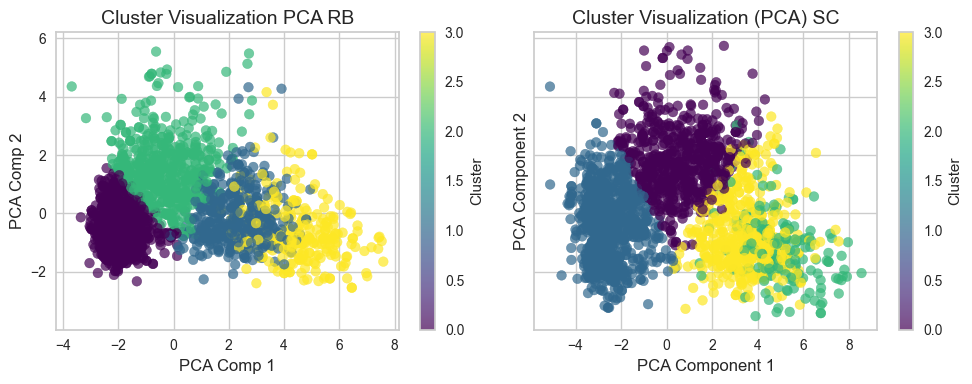

In [32]:
# PCA Visualization
pca1 = PCA(n_components=2)
X_pca_rb = pca1.fit_transform(X_rb_scaled)  # Reduce to 2D using PCA
pca_df_rb = pd.DataFrame(X_pca_rb, columns=['PCA1', 'PCA2'])
pca_df_rb['Cluster'] = k_means_rb.labels_

pca2 = PCA(n_components=2)
X_pca_st= pca2.fit_transform(X_st_scaled)  # Reduce to 2D using PCA
pca_df_st = pd.DataFrame(X_pca_st, columns=['PCA1', 'PCA2'])
pca_df_st['Cluster'] = k_means_st.labels_

# Create Subplots
fig, axes = plt.subplots(1, 2, figsize=(10, 4), sharey=True)

# PCA Plot
scatter1 = axes[0].scatter(pca_df_rb['PCA1'], pca_df_rb['PCA2'], c=pca_df_rb['Cluster'], cmap='viridis', alpha=0.7)
axes[0].set_title('Cluster Visualization PCA RB', fontsize=14)
axes[0].set_xlabel('PCA Comp 1', fontsize=12)
axes[0].set_ylabel('PCA Comp 2', fontsize=12)
axes[0].grid(True)
cbar1 = fig.colorbar(scatter1, ax=axes[0], label='Cluster')

scatter2 = axes[1].scatter(pca_df_st['PCA1'], pca_df_st['PCA2'], c=pca_df_st['Cluster'], cmap='viridis', alpha=0.7)
axes[1].set_title('Cluster Visualization (PCA) SC', fontsize=14)
axes[1].set_xlabel('PCA Component 1', fontsize=12)
axes[1].set_ylabel('PCA Component 2', fontsize=12)
axes[1].grid(True)
cbar1 = fig.colorbar(scatter1, ax=axes[1], label='Cluster')


# Adjust layout
plt.tight_layout()
plt.show()

### 3D Clusers

We see some overlapping between some clusters in 2D, so we use 3D plots as well if they can show data better.

In [33]:
pca = PCA(n_components=3)
pca_comps = pca.fit_transform(df_encoded)
pca_df = pd.DataFrame(pca_comps, columns=['P1','P2', 'P3'])

pca_rb = PCA(n_components=3)
pca_comps_rb = pca_rb.fit_transform(X_rb_scaled)
pca_df_rb = pd.DataFrame(pca_comps_rb, columns=['P1','P2', 'P3'])
#pca_df_rb['Cluster'] = df_encoded['Clus_km_rb']

pca_st = PCA(n_components=3)
pca_comps_st = pca_rb.fit_transform(X_st_scaled)
pca_df_st = pd.DataFrame(pca_comps_st, columns=['P1','P2', 'P3'])

In [36]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def visualize_clusters(data1, data2, data3,
                         predictions1=None, predictions2=None, predictions3=None,
                         marker_size=3,
                         #title="Principal Components in 3-Dimensions",
                         subplot_titles=("df_encoded", "Dataset 2 Title", "Dataset 3 Title")):
    
    fig = make_subplots(rows=1, cols=3,
                        subplot_titles=subplot_titles,
                        specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}, {'type': 'scatter3d'}]])

    datasets = [(data1, predictions1), (data2, predictions2), (data3, predictions3)]

    for i, (dataset, preds) in enumerate(datasets):
        if preds is not None:
            dataset['preds'] = preds
            trace = go.Scatter3d(
                x=dataset['P1'], y=dataset['P2'], z=dataset['P3'],
                mode='markers',
                marker=dict(size=marker_size, color=dataset['preds'], colorscale='Pastel', opacity=0.5)
            )
        else:
            trace = go.Scatter3d(
                x=dataset['P1'], y=dataset['P2'], z=dataset['P3'],
                mode='markers',
                marker=dict(size=marker_size, color='blue', opacity=0.5)  # Default color if no predictions
            )

        fig.add_trace(trace, row=1, col=i + 1)

    fig.update_layout() #title_text=title, title_x=0.5
    fig.show()

# Call the function with sample datasets and unique subplot titles
visualize_clusters(pca_df, pca_df_rb, pca_df_st,
                     subplot_titles=("Original Data without Scaling", 
                                    "Robust Scaler", 
                                    "Standard Scaler"))


In [43]:
# will be used later on for evaluation

# PCA with RobustScaler
db_rb = []
sil_rb = []
ca_rb = []
# PCA with StandartScaler
db_st = []
sil_st = []
ca_st = []
# t-SNE with RobustScaler
t_db_rb = []
t_sil_rb = []
t_ca_rb = []
# t-SNE with StandardScaler
t_db_st = []
t_sil_st = []
t_ca_st = []

In [37]:
import plotly.express as px
import nbformat

def visualize_clustering(data, predictions=None, marker_size=3, title="Principal Components in 3-Dimensions"):
  if predictions is not None:
    data['preds'] = predictions
    fig = px.scatter_3d(data, x='P1', y='P2', z='P3', color='preds',
                      color_discrete_sequence=px.colors.qualitative.Pastel, opacity=0.5)
  else:
    fig = px.scatter_3d(data, x='P1', y='P2', z='P3',
                        color_discrete_sequence=px.colors.qualitative.Pastel, opacity=0.5)

  fig.update_traces(marker_size = marker_size)
  fig.update_layout(title_text=title, title_x=0.5)
  fig.show()

In [38]:
cluster_k_st = KMeans(n_clusters=4)
cluster_k_st.fit(pca_df_st)

cluster_k_rb = KMeans(n_clusters=4)
cluster_k_rb.fit(pca_df_rb)

visualize_clustering(pca_df_st, cluster_k_st.labels_, title="KMeans K=4, PCA Standard Scaling")
visualize_clustering(pca_df_rb, cluster_k_rb.labels_, title="KMeans K=4, RobustScaler")

In [39]:
tsne = TSNE(n_components=3, random_state=42).fit_transform(df_encoded)  # Reduce to 3D using t-SNE
tsne_df = pd.DataFrame(tsne, columns=['T1', 'T2','T3'])

tsne_rb = TSNE(n_components=3, random_state=42).fit_transform(X_rb_scaled)  # Reduce to 3D using t-SNE
tsne_df_rb = pd.DataFrame(tsne_rb, columns=['T1', 'T2','T3'])

tsne_st = TSNE(n_components=3, random_state=42).fit_transform(X_st_scaled)  # Reduce to 3D using t-SNE
tsne_df_st = pd.DataFrame(tsne_st, columns=['T1', 'T2','T3'])

In [40]:
import plotly.express as px
import nbformat

def visualize_clustering_tsne(data, predictions=None, marker_size=3, title="Principal Components in 3-Dimensions"):
  if predictions is not None:
    data['preds'] = predictions
    fig = px.scatter_3d(data, x='T1', y='T2', z='T3', color='preds',
                      color_discrete_sequence=px.colors.qualitative.Pastel, opacity=0.5)
  else:
    fig = px.scatter_3d(data, x='T1', y='T2', z='T3',
                        color_discrete_sequence=px.colors.qualitative.Pastel, opacity=0.5)

  fig.update_traces(marker_size = marker_size)
  fig.update_layout(title_text=title, title_x=0.5)
  fig.show()

In [41]:
cluster_k_tsne = KMeans(n_clusters=4)
cluster_k_tsne.fit(tsne_df)

cluster_k_tsne_rb = KMeans(n_clusters=4)
cluster_k_tsne_rb.fit(tsne_df_rb)

cluster_k_tsne_st = KMeans(n_clusters=4)
cluster_k_tsne_st.fit(tsne_df_st)

visualize_clustering_tsne(tsne_df, cluster_k_tsne.labels_, title="KMeans K=4 t-SNE original")
visualize_clustering_tsne(tsne_df_rb, cluster_k_tsne_rb.labels_, title="KMeans K=4 t-SNE RB")
visualize_clustering_tsne(tsne_df_st, cluster_k_tsne_st.labels_, title="KMeans K=4 t-SNE ST")

In [44]:
db_rb.append(davies_bouldin_score(pca_df_rb, cluster_k_rb.labels_))
sil_rb.append(silhouette_score(pca_df_rb, cluster_k_rb.labels_))
ca_rb.append(calinski_harabasz_score(pca_df_rb, cluster_k_rb.labels_))

db_st.append(davies_bouldin_score(pca_df_st, cluster_k_st.labels_))
sil_st.append(silhouette_score(pca_df_st, cluster_k_st.labels_))
ca_st.append(calinski_harabasz_score(pca_df_st, cluster_k_st.labels_))

In [45]:
cluster_db = DBSCAN(eps=0.2, min_samples=6)
cluster_db.fit(pca_df_rb)

cluster_db_st = DBSCAN(eps=0.2, min_samples=6)
cluster_db_st.fit(pca_df_st)


visualize_clustering(pca_df_rb, cluster_db.labels_, title="DBSCAN RB")
visualize_clustering(pca_df_st, cluster_db_st.labels_, title="DBSCAN ST")

In [46]:
db_rb.append(davies_bouldin_score(pca_df_rb, cluster_db.labels_))
sil_rb.append(silhouette_score(pca_df_rb, cluster_db.labels_))
ca_rb.append(calinski_harabasz_score(pca_df_rb, cluster_db.labels_))

db_st.append(davies_bouldin_score(pca_df_st, cluster_db_st.labels_))
sil_st.append(silhouette_score(pca_df_st, cluster_db_st.labels_))
ca_st.append(calinski_harabasz_score(pca_df_st, cluster_db_st.labels_))

In [47]:
cluster_agg = AgglomerativeClustering(n_clusters=4)
cluster_agg.fit(pca_df_rb)

cluster_agg_st = AgglomerativeClustering(n_clusters=4)
cluster_agg_st.fit(pca_df_st)

visualize_clustering(pca_df_rb, cluster_agg.labels_, title="Agglomerative Clustering K=4 with RobustScaler")
visualize_clustering(pca_df_st, cluster_agg_st.labels_, title="Agglomerative Clustering K=4 with StandardScaler")

In [48]:
db_rb.append(davies_bouldin_score(pca_df_rb, cluster_agg.labels_))
sil_rb.append(silhouette_score(pca_df_rb, cluster_agg.labels_))
ca_rb.append(calinski_harabasz_score(pca_df_rb, cluster_agg.labels_))

db_st.append(davies_bouldin_score(pca_df_st, cluster_agg_st.labels_))
sil_st.append(silhouette_score(pca_df_st, cluster_agg_st.labels_))
ca_st.append(calinski_harabasz_score(pca_df_st, cluster_agg_st.labels_))

## 8. Evaluation

In [ ]:
t_db_rb.append(davies_bouldin_score(tsne_df_rb, cluster_k_tsne_rb.labels_))
t_sil_rb.append(silhouette_score(tsne_df_rb, cluster_k_tsne_rb.labels_))
t_ca_rb.append(calinski_harabasz_score(tsne_df_rb, cluster_k_tsne_rb.labels_))

t_db_st.append(davies_bouldin_score(tsne_df_st, cluster_k_tsne_st.labels_))
t_sil_st.append(silhouette_score(tsne_df_st, cluster_k_tsne_st.labels_))
t_ca_st.append(calinski_harabasz_score(tsne_df_st, cluster_k_tsne_st.labels_))

print('Davies Bouldin Index (Lower is better)', 'Silhouette Index (Higher is better)', 'Calinski-Harabasz Index (Higher is better)')

res_rb = pd.DataFrame({'DB PCA': db_rb, 'Sil PCA': sil_rb, 'CH PCA':ca_rb,'DB t-SNE': t_db_rb, 'Sil t-SNE': t_sil_rb, 'CH t-SNE':t_ca_rb }, index=['KMeans', 'DBSCAN', 'Agglomerative'])
#res_pca.index.names = ['Algorithm']

res_st = pd.DataFrame({'DB PCA': db_st, 'Sil PCA': sil_st, 'CH PCA':ca_st, 'DB t-SNE': t_db_st, 'Sil t-SNE': t_sil_st, 'CH t-SNE':t_ca_st }, index=['KMeans', 'DBSCAN', 'Agglomerative'])
#res_pca.index.names = ['Algorithm']


In [ ]:
res_rb

Davies Bouldin Index (Lower is better) Silhouette Index (Higher is better) Calinski-Harabasz Index (Higher is better)


,DB,Sil,CH,DB t-SNE,Sil t-SNE,CH t-SNE
KMeans,0.918592,0.509651,2682.779349,1.073939,0.341662,1604.119348
DBSCAN,0.637149,0.112132,118.526224,1.073939,0.341662,1604.119348
Agglomerative,0.976273,0.400270,1906.379522,1.073939,0.341662,1604.119348


In [ ]:
res_st

,DB,Sil,CH,DB t-SNE,Sil t-SNE,CH t-SNE
KMeans,0.917964,0.454010,2101.218945,1.036616,0.326293,1070.812166
DBSCAN,0.501404,0.063853,81.152751,1.036616,0.326293,1070.812166
Agglomerative,1.703951,0.226494,1368.263573,1.036616,0.326293,1070.812166


In [64]:
print('Davies Bouldin(DB) Index (Lower is better)', 'Silhouette (Sil) Index (Higher is better)', 'Calinski-Harabasz (CH) Index (Higher is better)')

res_rb = pd.DataFrame({
    'Metric': ['DB PCA', 'Sil PCA', 'CH PCA', 'DB t-SNE', 'Sil t-SNE', 'CH t-SNE'],
    'KMeans': [db_rb[0], sil_rb[0], ca_rb[0], t_db_rb[0], t_sil_rb[0], t_ca_rb[0]],
    'DBSCAN': [db_rb[1], sil_rb[1], ca_rb[1], '-', t_sil_rb[1], '-'],
    'Agglomerative': [db_rb[2], sil_rb[2], ca_rb[2], '-', '-', '-'],
    'Type': 'RB'
})

res_st = pd.DataFrame({
    'Metric': ['DB PCA', 'Sil PCA', 'CH PCA', 'DB t-SNE', 'Sil t-SNE', 'CH t-SNE'],
    'KMeans': [db_st[0], sil_st[0], ca_st[0], t_db_st[0], t_sil_st[0], t_ca_st[0]],
    'DBSCAN': [db_st[1], sil_st[1], ca_st[1], '-', t_sil_st[1], t_ca_st[1]],
    'Agglomerative': [db_st[2], sil_st[2], ca_st[2], '-', '-', '-'],
    'Type': 'ST'
})

# Combine the two datasets
combined = pd.concat([res_rb, res_st])

# Pivot so RB and ST are next to each other for each algorithm
pivoted = combined.pivot(index='Metric', columns='Type')

# Flatten the multi-index columns
pivoted.columns = [f"{alg}_{typ}" for alg, typ in pivoted.columns]

pivoted

Davies Bouldin(DB) Index (Lower is better) Silhouette (Sil) Index (Higher is better) Calinski-Harabasz (CH) Index (Higher is better)


,KMeans_RB,KMeans_ST,DBSCAN_RB,DBSCAN_ST,Agglomerative_RB,Agglomerative_ST
Metric,,,,,,
CH PCA,2682.779349,2101.218945,118.526224,81.152751,1906.379522,1368.263573
CH t-SNE,1604.119348,1070.812166,-,-,-,-
DB PCA,0.918592,0.917964,0.637149,0.501404,0.976273,1.703951
DB t-SNE,1.073939,1.036616,-,-,-,-
Sil PCA,0.509651,0.454010,0.112132,0.063853,0.40027,0.226494
Sil t-SNE,0.341662,0.326293,-,-,-,-


In [56]:
from sklearn.mixture import GaussianMixture

optimal_k = 4

gmm = GaussianMixture(n_components=optimal_k, random_state=42)
gmm_labels = gmm.fit_predict(pca_df_rb)
silhouette_gmm = silhouette_score(X_rb_scaled, gmm_labels)


In [57]:
print(f"K-Means Silhouette Score: {silhouette_score(pca_df_rb, cluster_k_rb.labels_)}")
print(f"GMM Silhouette Score: {silhouette_gmm}")

K-Means Silhouette Score: 0.37845267711634983
GMM Silhouette Score: 0.10521080548536153


### Selection of Tools/ Methods 
The best results come from RobustScaler with PCA and KMean.

In [36]:
# add cluster labels to the original dataset
df['Cluster'] = cluster_k_rb.labels_

df.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,...,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,total_children,total_spending,num_purchase,Cluster
ID,,,,,,,,,,,,,,,,,,,,,
5524,Graduation,Single,58138.0,0,0,2012,58,635,88,546,...,0,0,0,0,1,67,0,1617,25,3
2174,Graduation,Single,46344.0,1,1,2014,38,11,1,6,...,0,0,0,0,0,70,2,27,6,0
4141,Graduation,Together,71613.0,0,0,2013,26,426,49,127,...,0,0,0,0,0,59,0,776,21,1
6182,Graduation,Together,26646.0,1,0,2014,26,11,4,20,...,0,0,0,0,0,40,1,53,8,0
5324,PhD,Together,58293.0,1,0,2014,94,173,43,118,...,0,0,0,0,0,43,1,422,19,2


## 9. Evaluating Clusters

### 9.1 Demographics

In [41]:
def set_labels(x="", y="", title="", axis=None, figsize=None):
    if figsize:
        plt.figure(figsize=figsize)
    
    if axis:
        axis.set_xlabel(x)
        axis.set_ylabel(y)
        axis.set_title(title)
    else:
        plt.title(title)
        plt.xlabel(x)
        plt.ylabel(y)

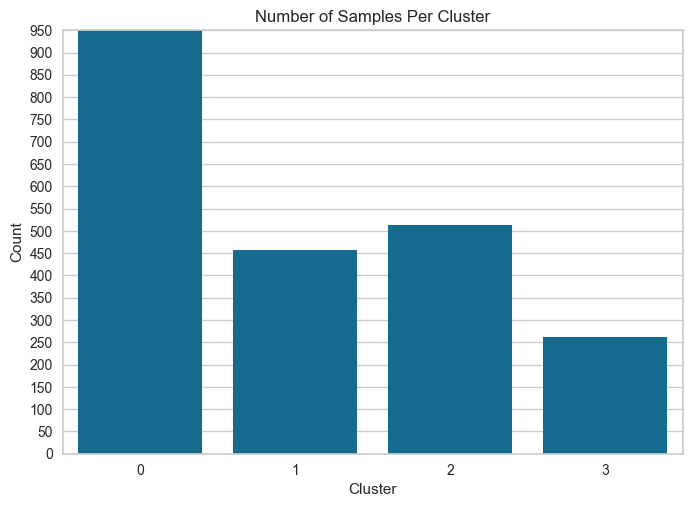

In [46]:
sns.countplot(data=df, x='Cluster');
set_labels(y="Count", x="Cluster", title="Number of Samples Per Cluster");
plt.yticks(list(range(0,951, 50)));
plt.ylim([0,950]);

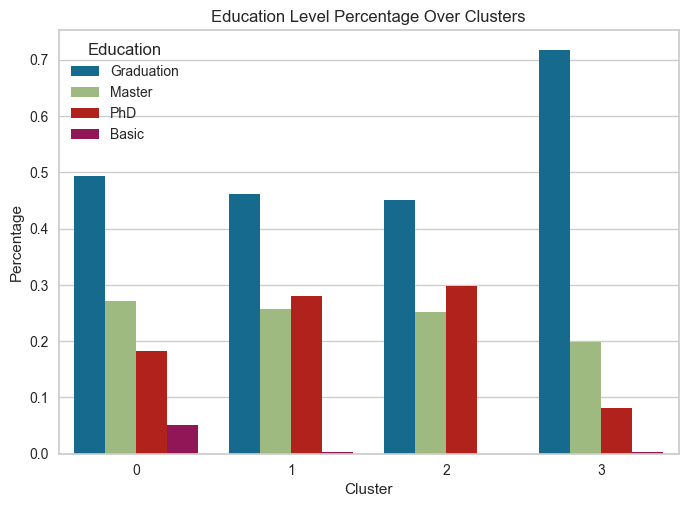

In [45]:
counted = df.groupby('Cluster').Education.value_counts(normalize=True).reset_index(name="percentage")
counted
sns.barplot(data=counted, x='Cluster', y='percentage', hue='Education');
set_labels(y="Percentage", x="Cluster", title="Education Level Percentage Over Clusters");

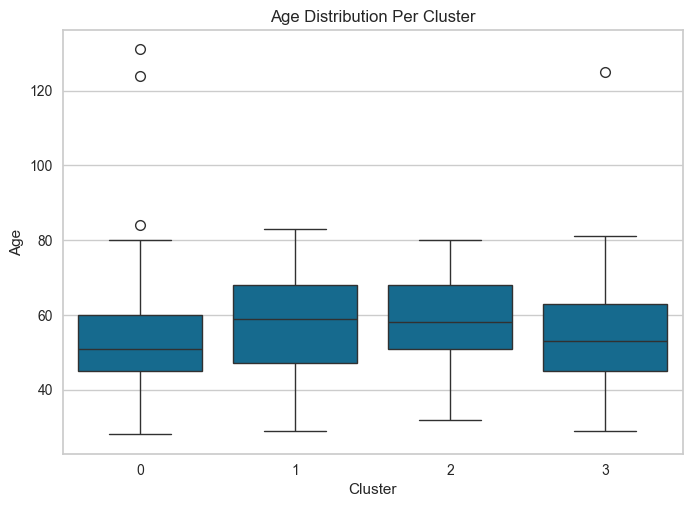

In [50]:
sns.boxplot(data=df, y='Age', x='Cluster');
set_labels(y="Age", x="Cluster", title="Age Distribution Per Cluster");
#plt.yticks(list(range(1935,2000, 5)))
#plt.ylim([1939,2000]);

/var/folders/pn/sq35y9ld2d38j62frtw2h194tq6wcq/T/ipykernel_1744/2731865937.py:1: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




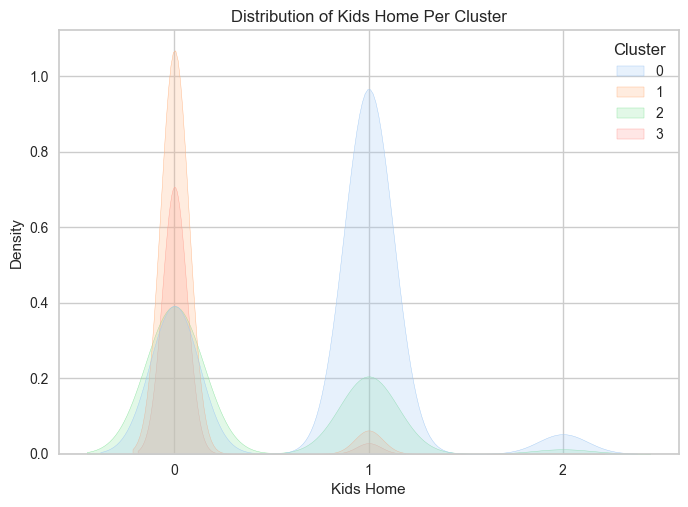

In [51]:
sns.kdeplot(data=df, x='Kidhome', hue='Cluster', palette='pastel', shade=True,);
set_labels(x="Kids Home", y="Density", title="Distribution of Kids Home Per Cluster");
plt.xticks(list(range(0,3, 1)));

/var/folders/pn/sq35y9ld2d38j62frtw2h194tq6wcq/T/ipykernel_1744/78117027.py:1: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




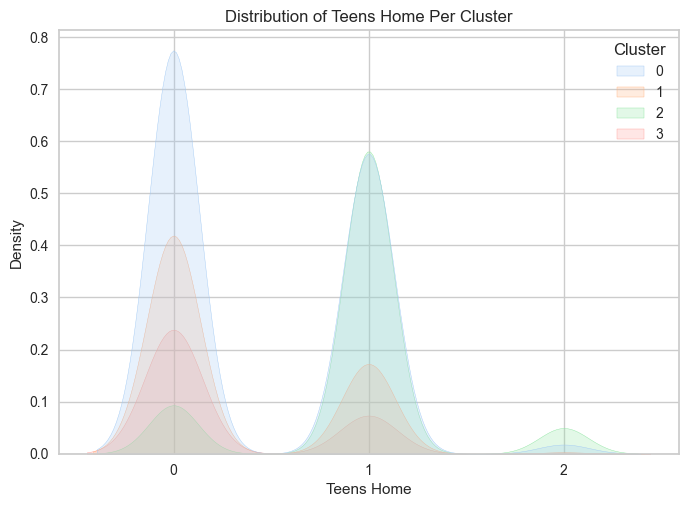

In [52]:
sns.kdeplot(data=df, x='Teenhome', hue='Cluster', palette='pastel', shade=True);
set_labels(x="Teens Home", y="Density", title="Distribution of Teens Home Per Cluster");
plt.xticks(list(range(0,3, 1)));

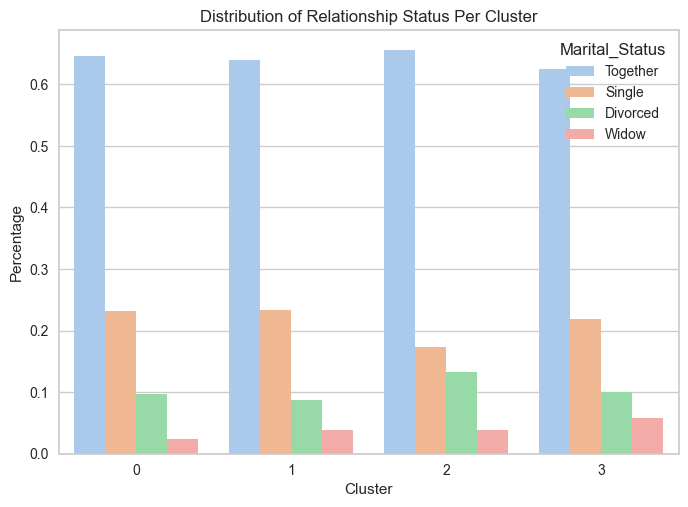

In [53]:
grouped = df.groupby("Cluster")['Marital_Status'].value_counts(normalize=True).reset_index(name="percentage")
set_labels(x="Cluster", y="Percentage", title="Distribution of Relationship Status Per Cluster");
sns.barplot(data=grouped, x='Cluster', y='percentage', hue='Marital_Status', palette='pastel');

In [54]:
amount = df.groupby('Cluster').Income.mean()
fig = px.pie(values=np.round(amount.values, 2), names=amount.index,  
             color_discrete_sequence=px.colors.qualitative.Pastel)
fig.data[0].textinfo = 'percent+value'
fig.update_layout(title_text='Average Income Per Group', title_x=0.5)

### 9.2 Behavioural

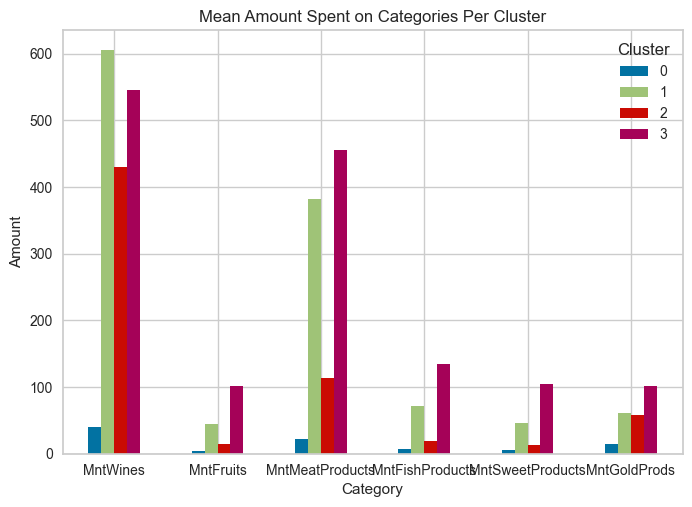

In [ ]:
cols = ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']
accepted = df.groupby("Cluster")[cols].mean().T

accepted.plot(kind='bar', rot=0);
set_labels(x="Category", y="Amount", title="Mean Amount Spent on Categories Per Cluster");

/var/folders/pn/sq35y9ld2d38j62frtw2h194tq6wcq/T/ipykernel_1744/2361185479.py:1: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




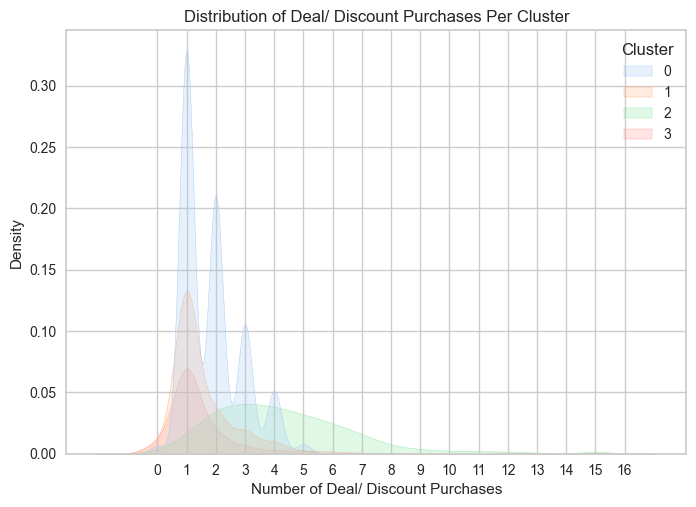

In [56]:
sns.kdeplot(data=df, x='NumDealsPurchases', hue='Cluster', palette='pastel', shade=True);
set_labels(x="Number of Deal/ Discount Purchases", y="Density", title="Distribution of Deal/ Discount Purchases Per Cluster");
plt.xticks(list(range(0, 17, 1)));

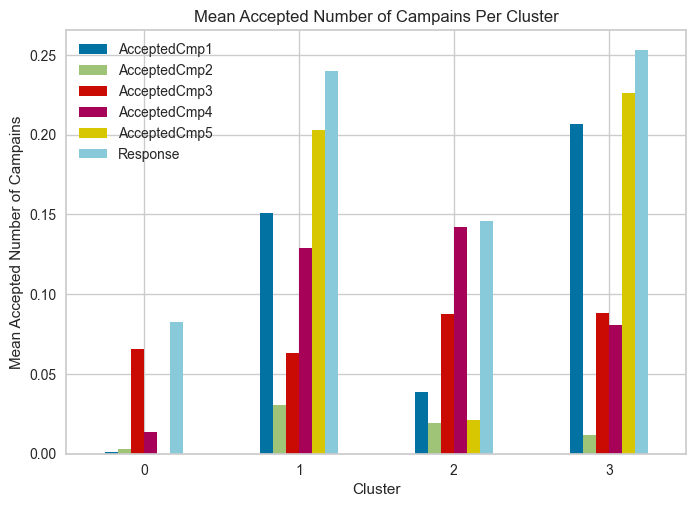

In [58]:
accepted = df.groupby("Cluster")[['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4',
           'AcceptedCmp5', 'Response']].mean()

accepted.plot(kind='bar', rot=0);
set_labels(x="Cluster", y="Mean Accepted Number of Campains", title="Mean Accepted Number of Campains Per Cluster");

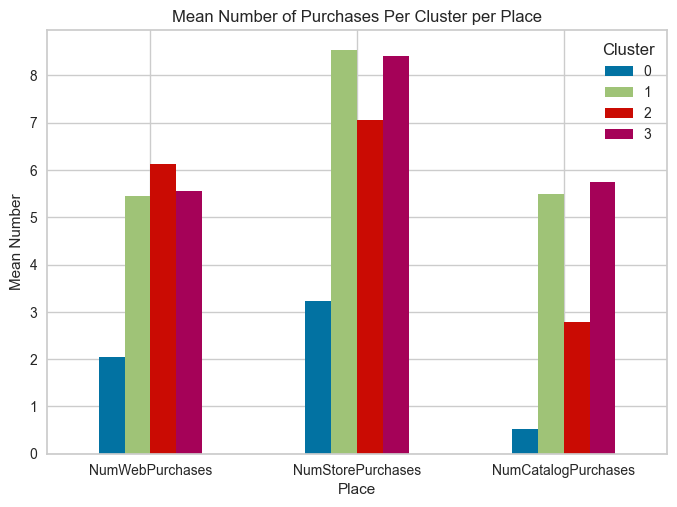

In [62]:
accepted = df.groupby("Cluster")[['NumWebPurchases', 'NumStorePurchases', 'NumCatalogPurchases']].mean().T

accepted.plot(kind='bar', rot=0);
set_labels(x="Place", y="Mean Number", title="Mean Number of Purchases Per Cluster per Place");

<Axes: xlabel='total_spending', ylabel='Income'>

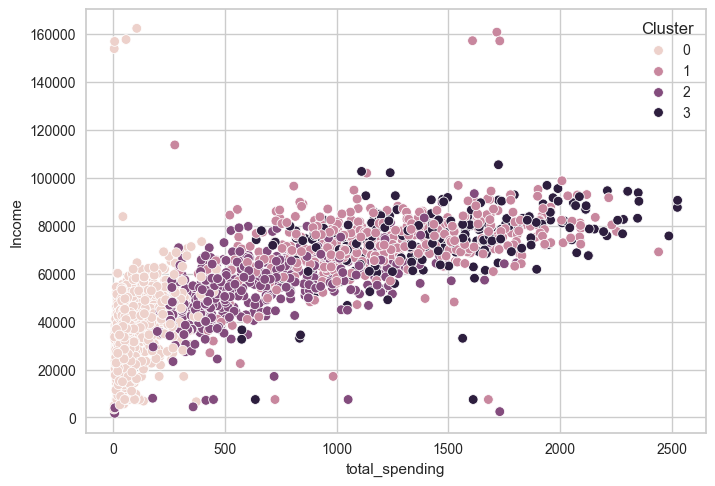

In [67]:
sns.scatterplot(x=df['total_spending'], y=df['Income'], hue=df['Cluster'])

Definition of each cluster: